# Plot Appalachian BH stations with PyGMT
This notebook reads the station CSV `appalachian_BH_stations_1.5yr_plus.csv`,
detects latitude/longitude columns, and makes a simple PyGMT map plotting
station locations. The figure is saved to `appalachian_stations_map.png`.

In [4]:
import os
import pandas as pd
from pprint import pprint

csv_path = 'appalachian_BH_stations_1.5yr_plus.csv'
if not os.path.exists(csv_path):
    raise FileNotFoundError(f'{csv_path} not found in notebook working directory')

df = pd.read_csv(csv_path)
print('CSV loaded. Columns:')
pprint(list(df.columns))

# Common column name candidates for lon/lat
lon_candidates = ['lon','longitude','LONGITUDE','Lon','Longitude','LON','x','lon_dd']
lat_candidates = ['lat','latitude','LATITUDE','Lat','Latitude','LAT','y','lat_dd']

def find_column(candidates, columns):
    for c in candidates:
        if c in columns:
            return c
    # try case-insensitive match
    lower_map = {col.lower(): col for col in columns}
    for c in candidates:
        if c.lower() in lower_map:
            return lower_map[c.lower()]
    return None

lon_col = find_column(lon_candidates, df.columns)
lat_col = find_column(lat_candidates, df.columns)

if lon_col is None or lat_col is None:
    raise ValueError(f'Could not detect lon/lat columns. Available columns: {list(df.columns)}')

print(f"Using longitude column: {lon_col}\nUsing latitude column: {lat_col}")

# Ensure numeric
df = df.copy()
df[lon_col] = pd.to_numeric(df[lon_col], errors='coerce')
df[lat_col] = pd.to_numeric(df[lat_col], errors='coerce')
df = df.dropna(subset=[lon_col, lat_col])
print(f'Read {len(df)} station rows with valid coordinates')

CSV loaded. Columns:
['network',
 'station',
 'latitude',
 'longitude',
 'elevation_m',
 'start_date',
 'end_date',
 'duration_years']
Using longitude column: longitude
Using latitude column: latitude
Read 447 station rows with valid coordinates


Map region: [-91.37545080000001, -72.66325320000001, 30.968151100000004, 43.521949899999996]
Saved map to appalachian_stations_map.png


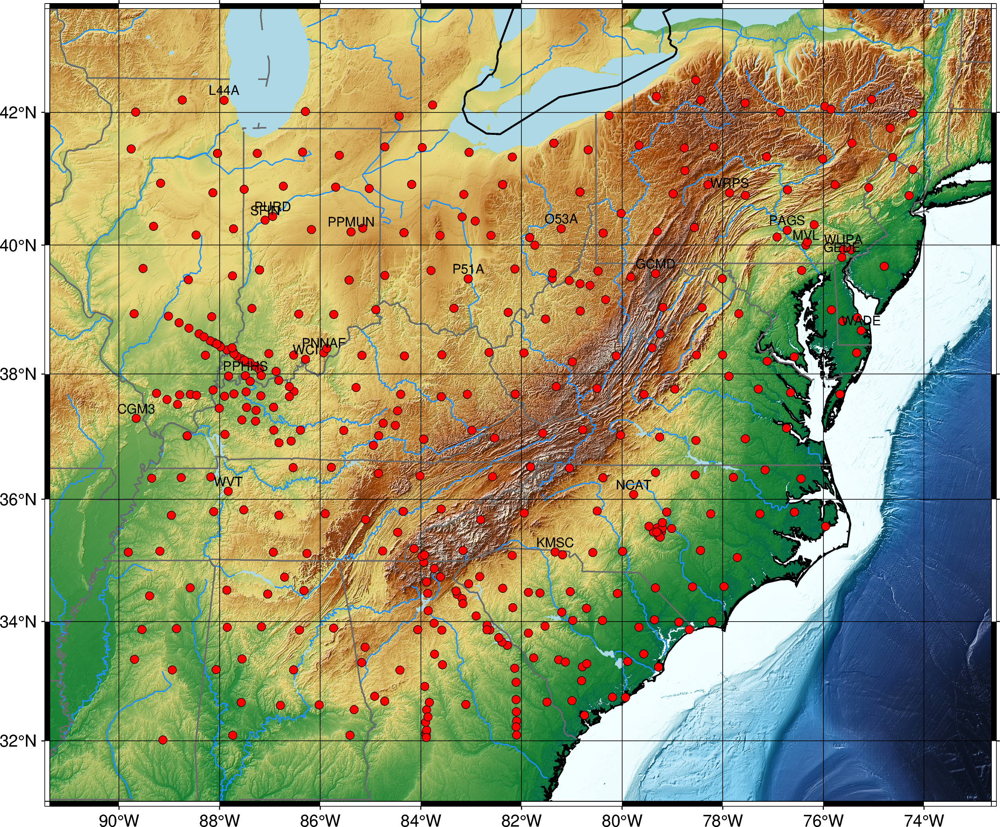

In [11]:
# Plot with PyGMT (falls back to a helpful message if PyGMT not installed)
try:
    import pygmt
except Exception as e:
    raise ImportError('PyGMT is required to run the plotting cells. Install with `pip install pygmt` and ensure GMT is installed (see PyGMT docs).') from e

# Compute map region from station extents with a small buffer
minlon = float(df[lon_col].min())
maxlon = float(df[lon_col].max())
minlat = float(df[lat_col].min())
maxlat = float(df[lat_col].max())

# Add margin (degrees) to the region
dlon = max(0.5, (maxlon - minlon) * 0.1)
dlat = max(0.5, (maxlat - minlat) * 0.1)
region = [minlon - dlon, maxlon + dlon, minlat - dlat, maxlat + dlat]
print('Map region:', region)

# Output file
output_png = 'appalachian_stations_map.png'

fig = pygmt.Figure()
# Load a low-resolution relief (faster than high-res). May download on first run.
grid = pygmt.datasets.load_earth_relief(resolution='15s', region=region)
fig.grdimage(grid=grid, region=region, projection='M8i', cmap='geo', shading=True)
# Draw coastlines, rivers and lake boundaries (lakes parameter) on top of relief; increase shoreline pen for clearer lake outlines
#fig.coast(region=region, projection='M8i', shorelines='1/0.8p,black', borders=['1/1p,black','2/0.7p,dimgray'], rivers='a/0.6p,dodgerblue', lakes='lightblue', frame=['ag', 'WSne+t'])
fig.coast(
    region=region,
    projection="M8i",
    shorelines="1/0.8p,black",
    borders=["1/1p,black", "2/0.7p,dimgray"],
    rivers="a/0.6p,dodgerblue",
    lakes="lightblue",
    frame=["ag", "WSne+t"],
)



# Plot stations
fig.plot(x=df[lon_col], y=df[lat_col], style='c0.18c', fill='red', pen='0.2p,black')

# Optionally label a few stations if a name column exists
name_candidates = ['name','station','sta','site','station_name']
name_col = None
for c in name_candidates:
    if c in df.columns:
        name_col = c
        break

if name_col is not None:
    sample = df[[lon_col, lat_col, name_col]].dropna().head(20)
    for _, row in sample.iterrows():
        fig.text(x=row[lon_col], y=row[lat_col]+0.08, text=str(row[name_col]), font='8p,Helvetica,black', justify='CB')

fig.savefig(output_png, dpi=300)
print(f'Saved map to {output_png}')
fig.show()

## Notes and requirements
- This notebook expects `appalachian_BH_stations_1.5yr_plus.csv` to be in the same folder as the notebook.
- Required Python packages: `pandas`, `pygmt`, `numpy` (PyGMT may require a working GMT installation).
- To run the notebook headless and produce the PNG, you can run:

```bash
jupyter nbconvert --to notebook --execute plot_appalachian_stations_pygmt.ipynb --ExecutePreprocessor.timeout=600
# or run the plotting cell in an interactive session (Jupyter)
```

If you want, I can try running the notebook here (if environment has PyGMT/GMT).